

In this Notebook, examples of code for generative models will be presented as part of the educational content. Following this, you will have a task focused on fine-tuning pre-trained diffusion models on medical images and texts. In this project, we aim to cover various topics, including the concepts of generative models, fine-tuning using the LoRA model, and self-supervised learning.

# Educational section

## Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.






### Getting Started

For this assignment, you will be using the MNIST dataset.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise
                      (affects activation and batchnorm)
        '''
        #     Steps:
        #       1) Do a transposed convolution using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a ReLU activation.
        #       4) If its the final layer, use a Tanh activation after the deconvolution.

        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                #### START CODE HERE ####
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True)
                #### END CODE HERE ####
            )
        else: # Final Layer
            return nn.Sequential(
                #### START CODE HERE ####
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh()
                #### END CODE HERE ####
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels of the output image, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise
                      (affects activation and batchnorm)
        '''
        #     Steps:
        #       1) Add a convolutional layer using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a LeakyReLU activation with slope 0.2.

        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                #### START CODE HERE #### #
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True)
                #### END CODE HERE ####
            )
        else: # Final Layer
            return nn.Sequential(
                #### START CODE HERE #### #
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                #### END CODE HERE ####
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

### Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [ ]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels, n_classes)
    #### END CODE HERE ####

Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [ ]:
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector.
        In this assignment, this will be the noise vector of shape (n_samples, z_dim),
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x, y), dim=1).float()
    #### END CODE HERE ####
    return combined

### Training
Now you can start to put it all together!

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [ ]:
mnist_shape = (1, 28, 28)
n_classes = 10

  *   criterion: the loss function (use appropriate loss function)
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [ ]:
#### START CODE HERE ####
criterion = nn.BCEWithLogitsLoss()
#### END CODE HERE ####

n_epochs = 40
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 330866654.82it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 87336477.16it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 108545867.42it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw




100%|██████████| 4542/4542 [00:00<00:00, 19885729.40it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [ ]:
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns:
        generator_input_dim: the input dimensionality of the conditional generator,
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [ ]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 2.05516359937191, discriminator loss: 0.26254106508940456


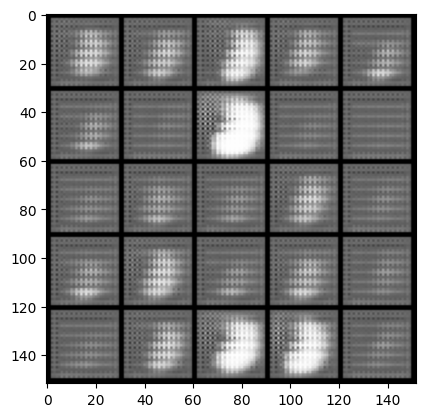

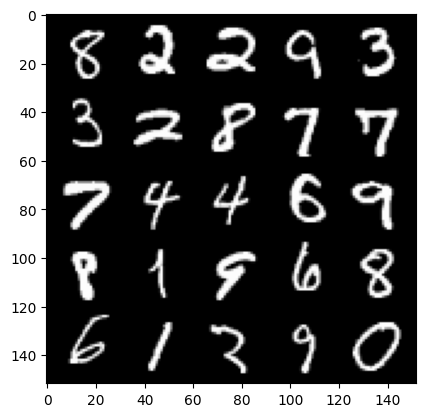

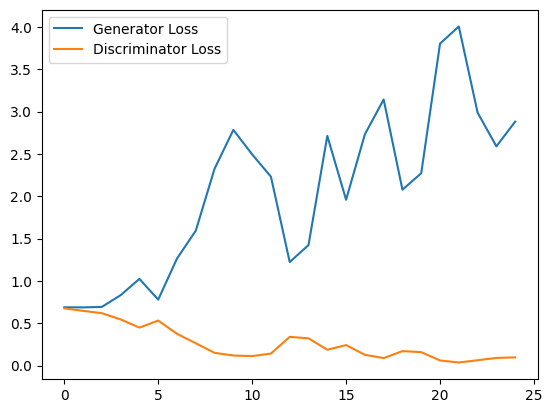

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 4.2126494059562685, discriminator loss: 0.04104972045123577


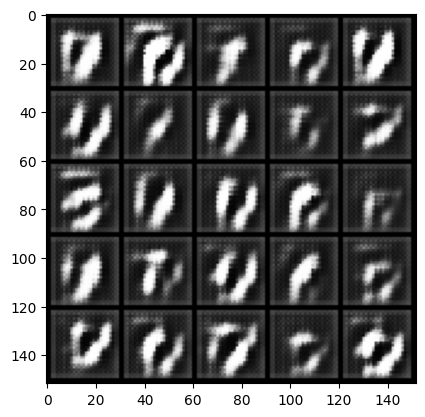

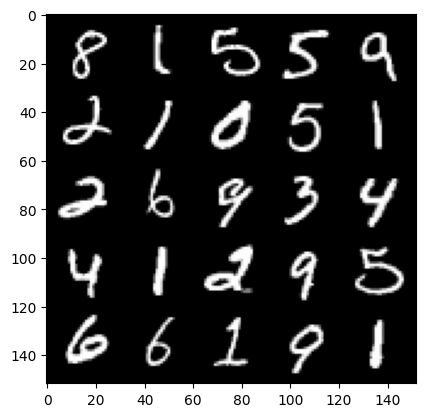

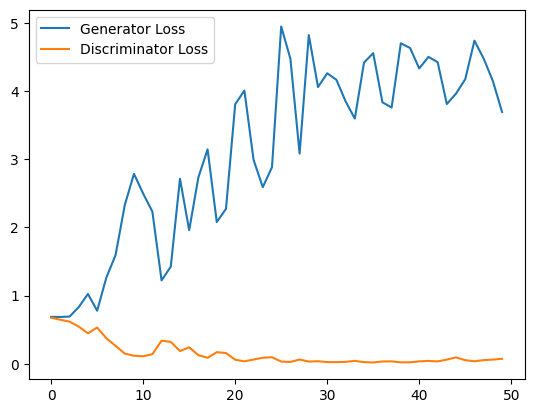

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 3.7099142570495607, discriminator loss: 0.09264157402142882


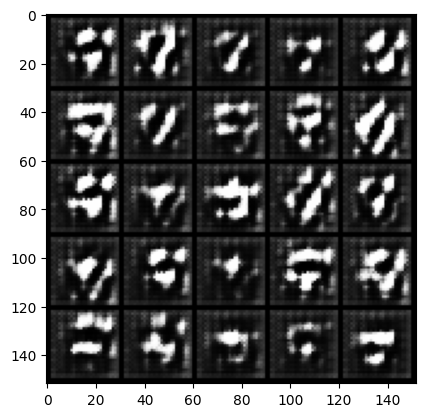

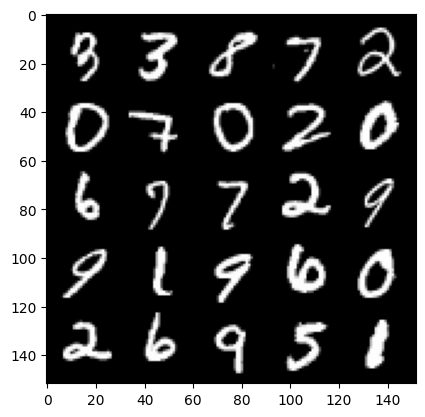

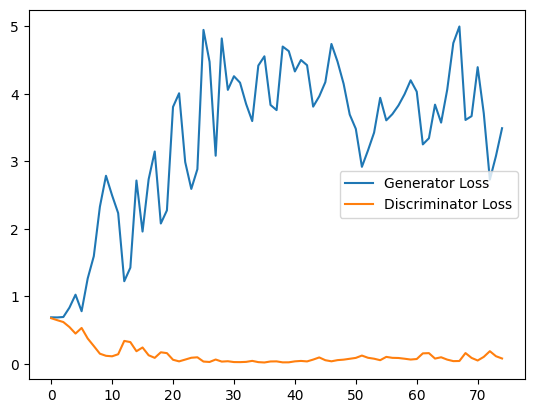

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 3.062428940296173, discriminator loss: 0.15464636010676622


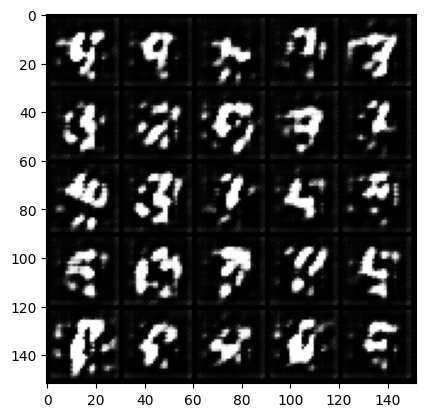

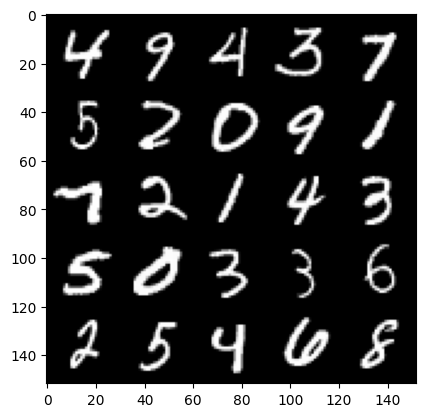

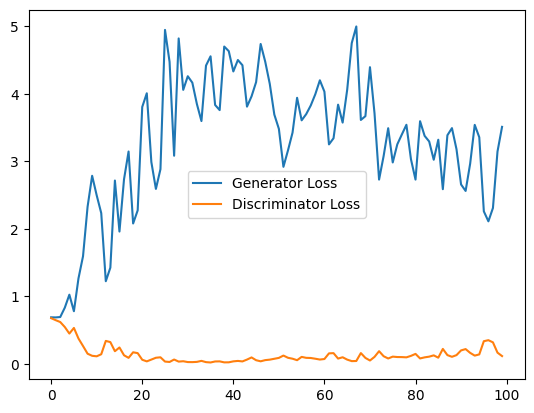

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 2.302395579814911, discriminator loss: 0.30795129311084746


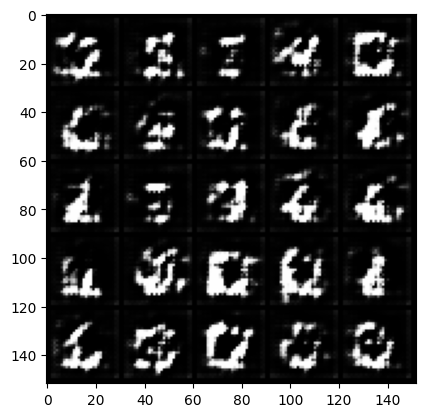

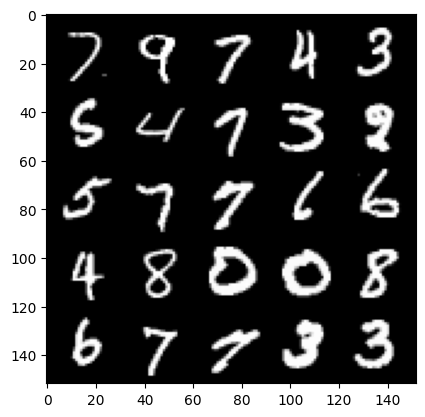

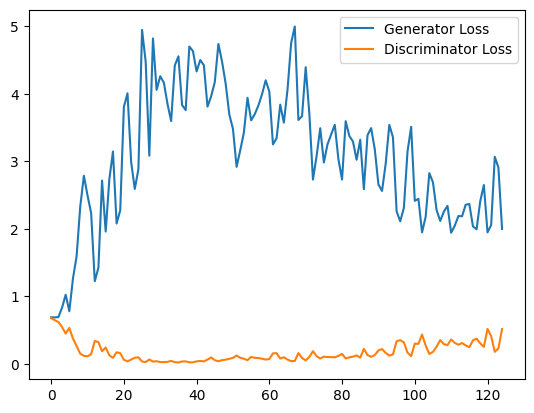

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.097534643173218, discriminator loss: 0.3434930983781815


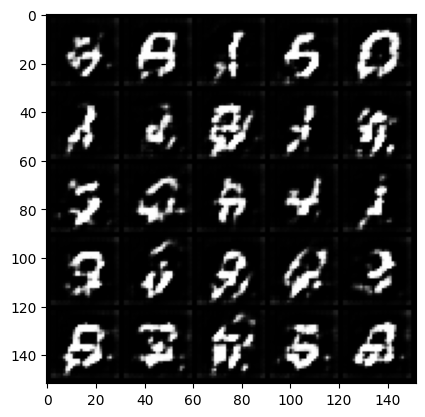

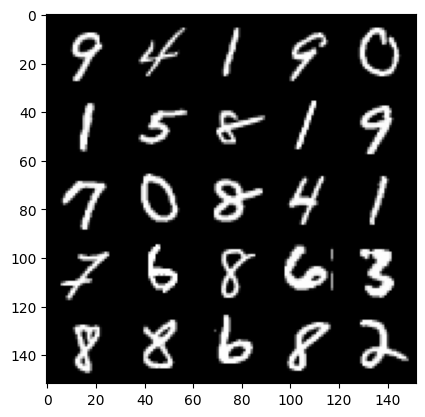

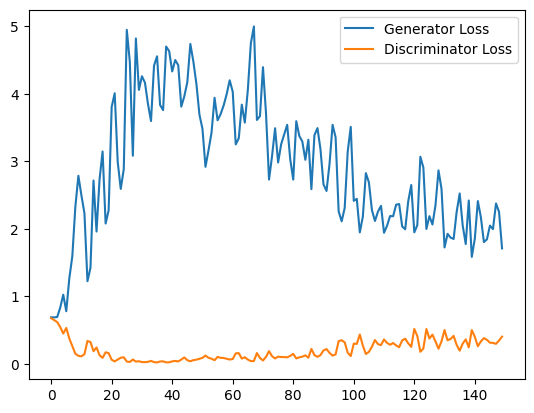

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 1.9502102489471436, discriminator loss: 0.32069997322559357


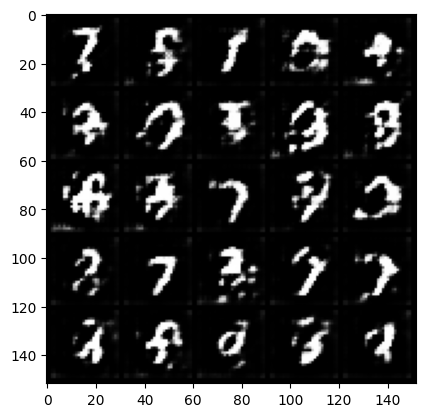

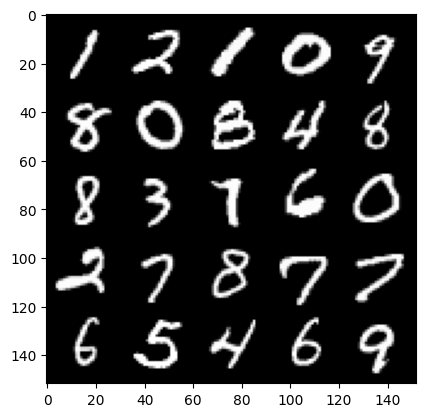

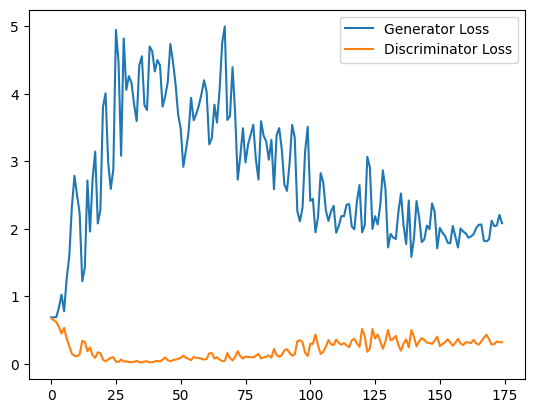

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.069895176410675, discriminator loss: 0.3632186457514763


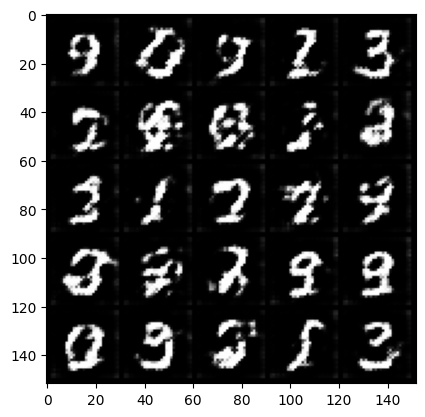

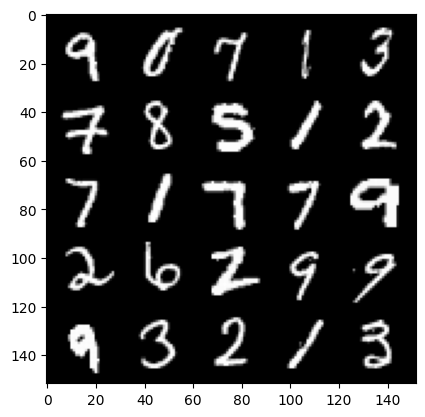

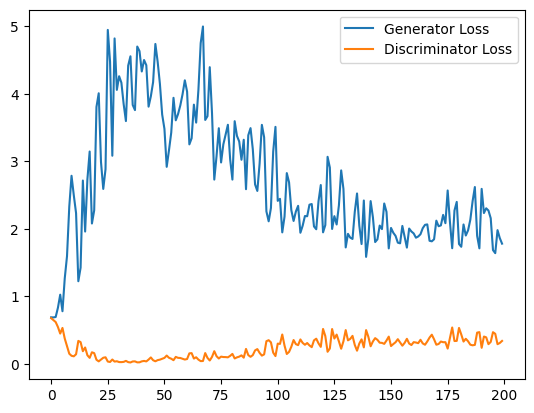

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 1.9100915977954864, discriminator loss: 0.343521516174078


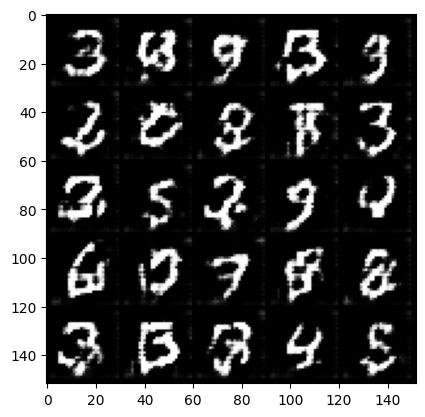

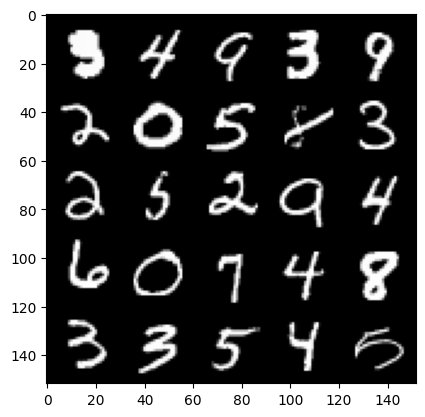

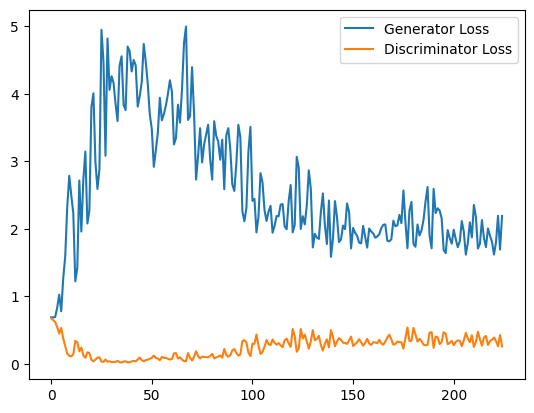

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 1.878248506307602, discriminator loss: 0.35419603472948075


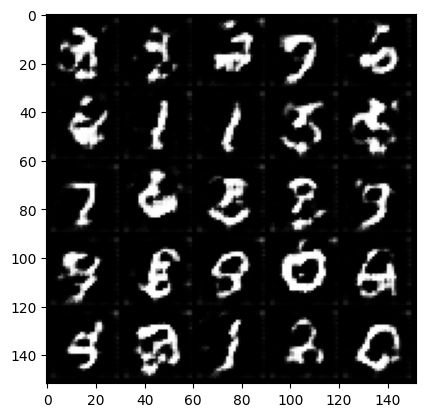

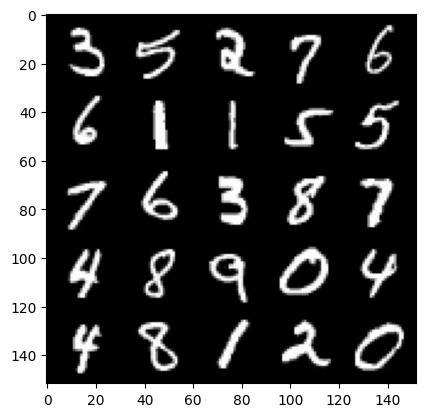

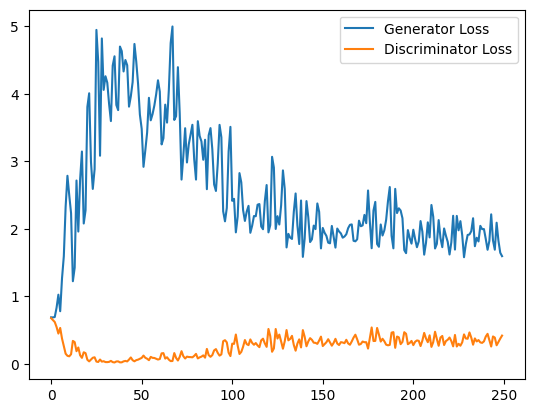

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 1.7957528584003448, discriminator loss: 0.37093204686045644


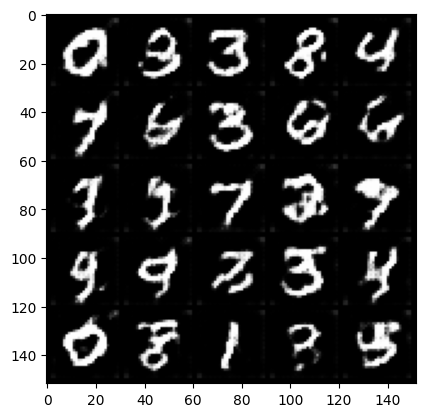

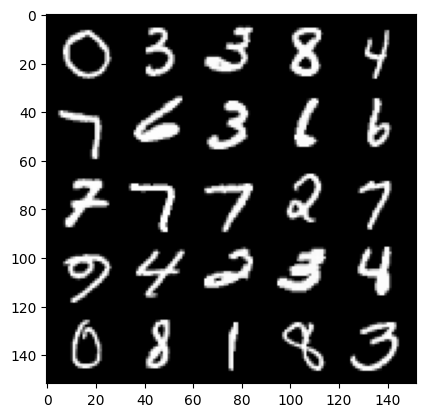

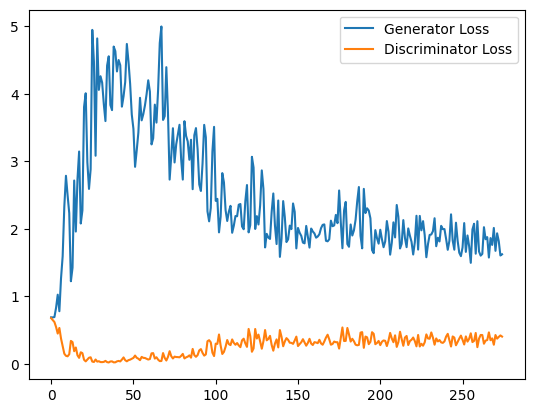

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 1.739697350025177, discriminator loss: 0.3973606880307198


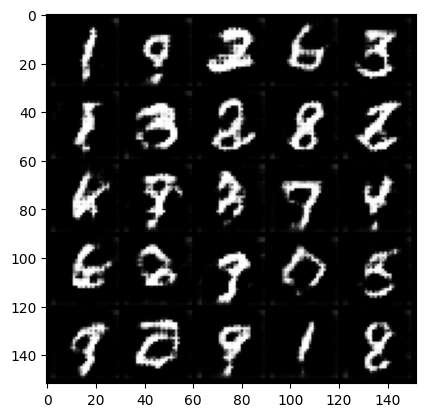

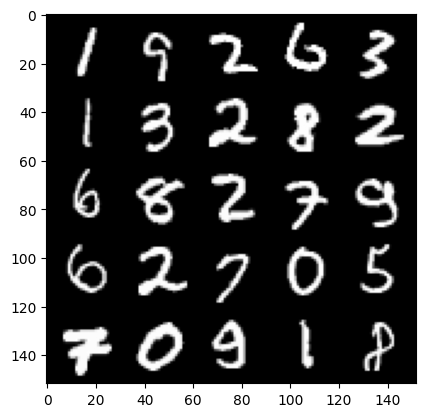

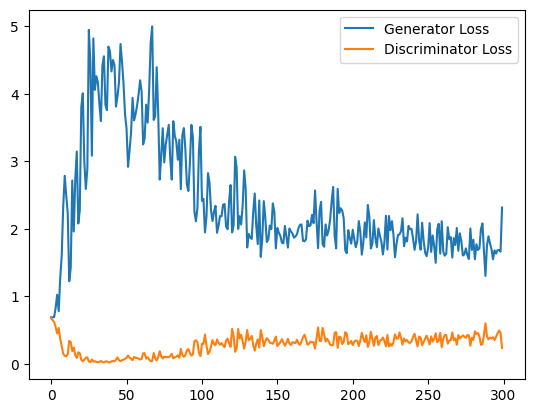

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 1.594943966627121, discriminator loss: 0.416204517185688


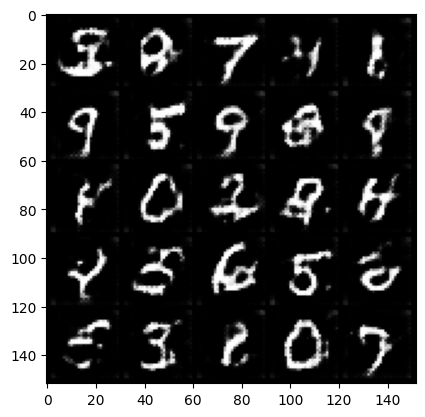

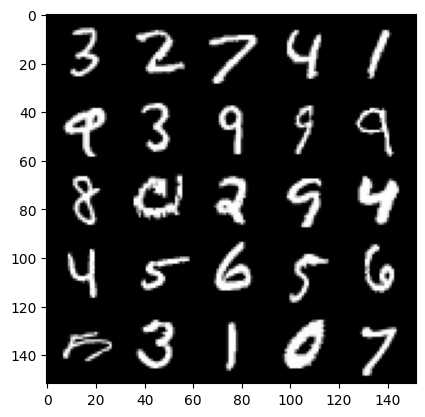

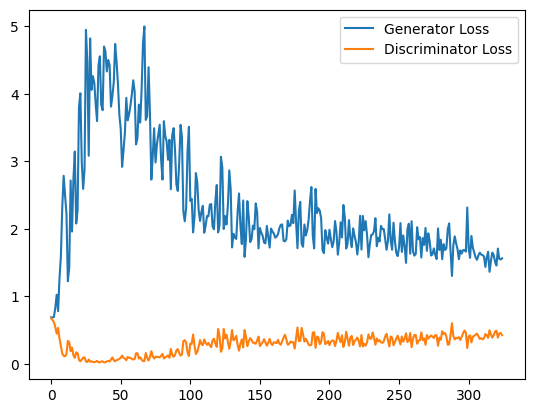

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 1.614268223285675, discriminator loss: 0.4520298860669136


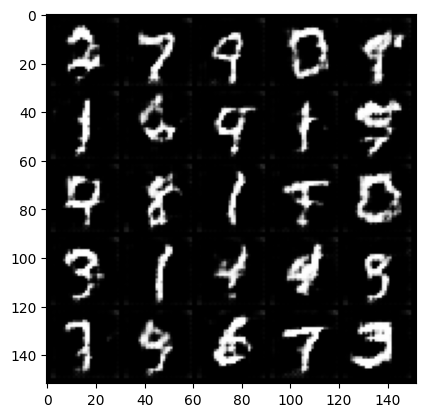

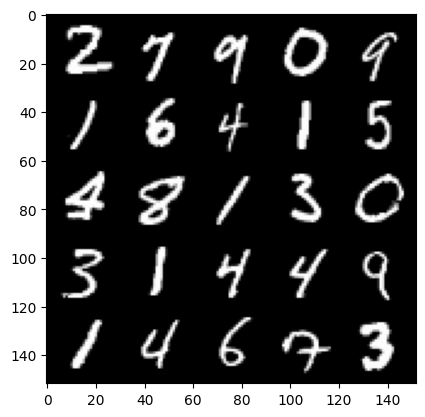

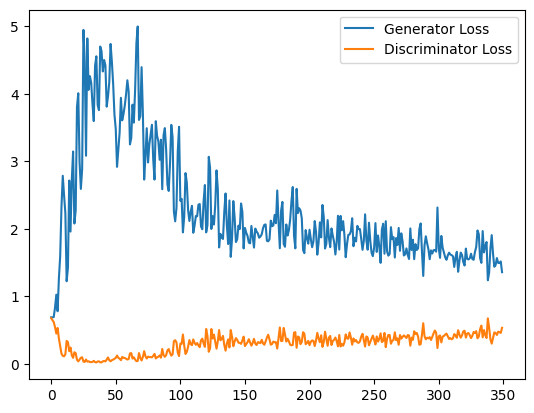

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 1.5625087761878966, discriminator loss: 0.451277379155159


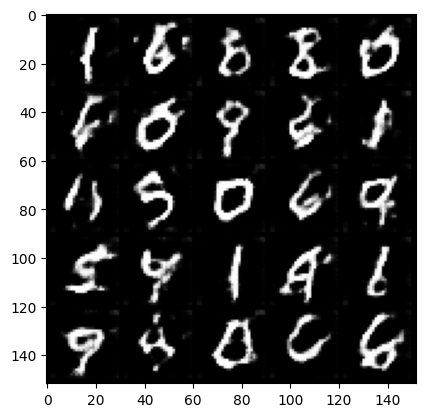

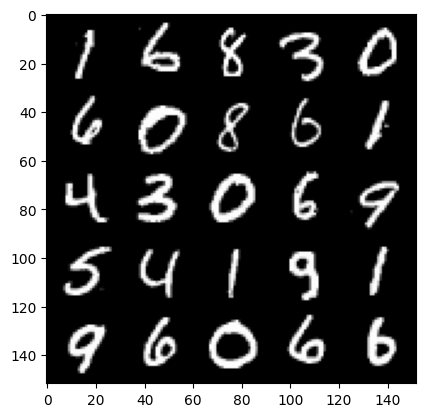

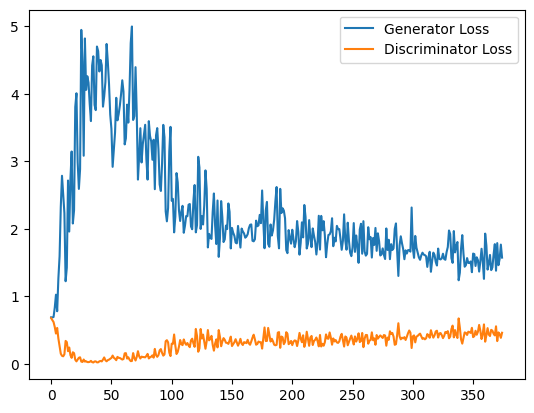

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 1.4534973052740097, discriminator loss: 0.46335768288373946


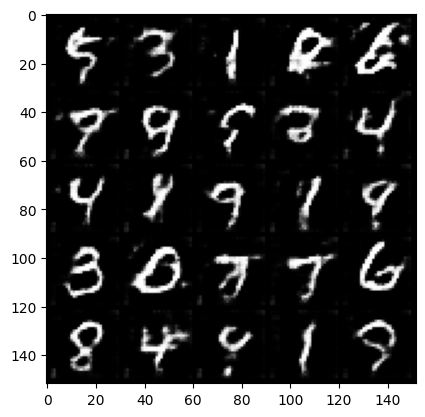

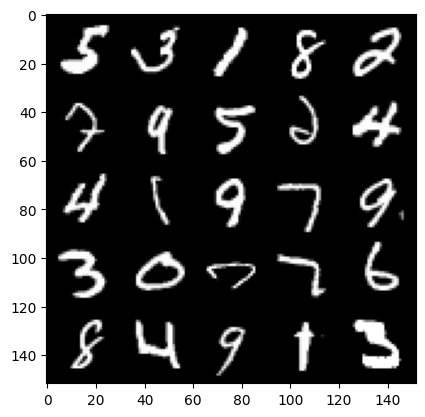

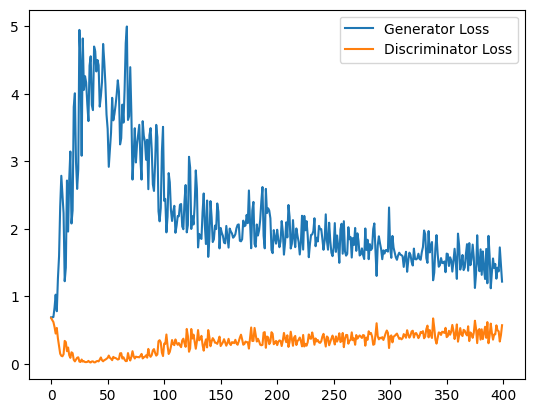

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 1.4508547403812408, discriminator loss: 0.48689654871821403


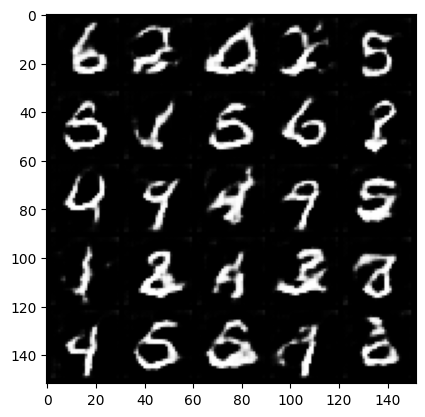

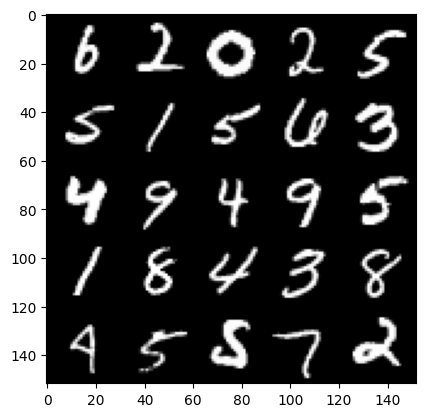

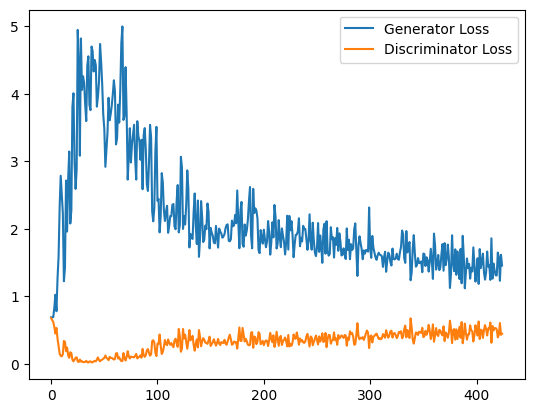

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 1.3867300255298614, discriminator loss: 0.49736191940307617


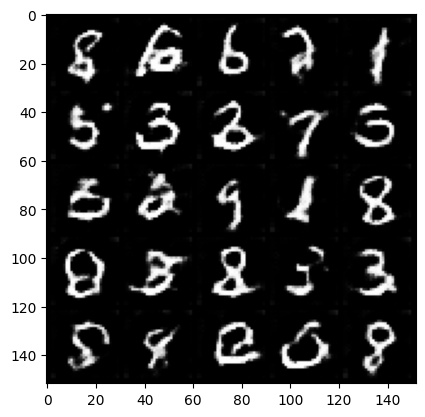

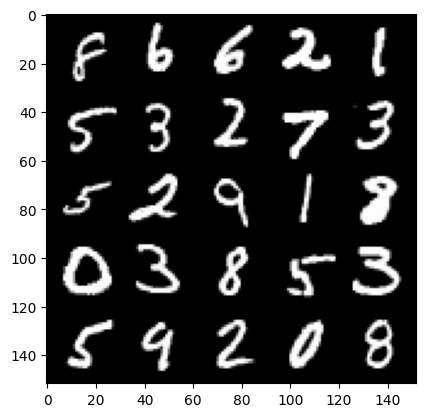

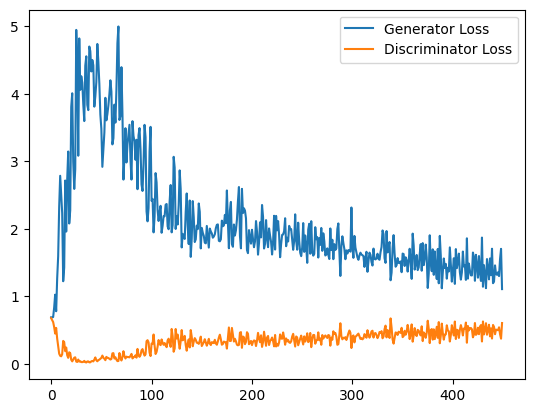

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 1.3195346571207047, discriminator loss: 0.4994153399467468


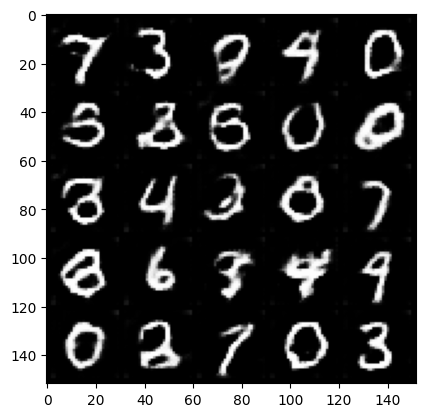

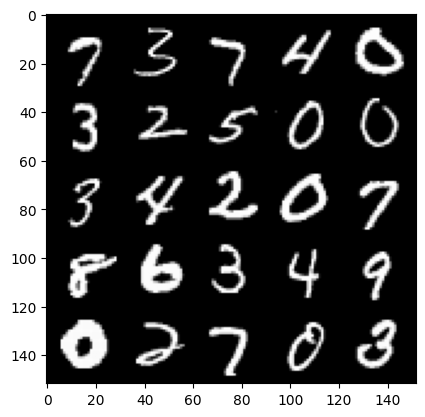

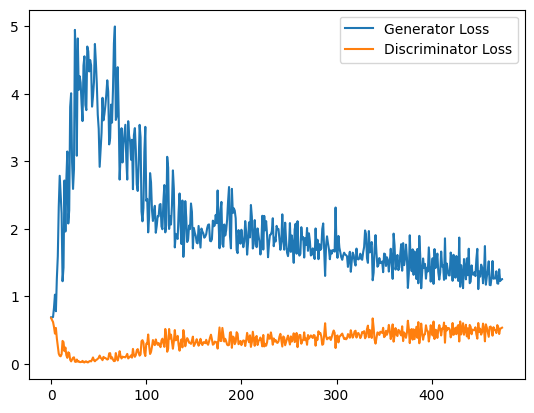

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 1.306546185016632, discriminator loss: 0.504605575978756


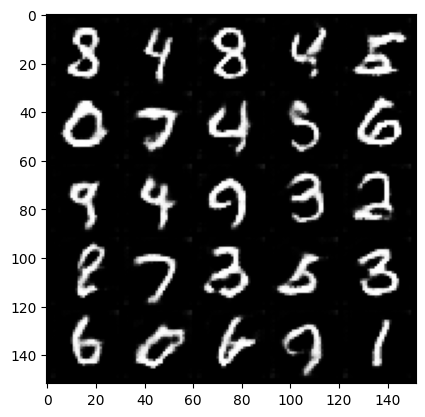

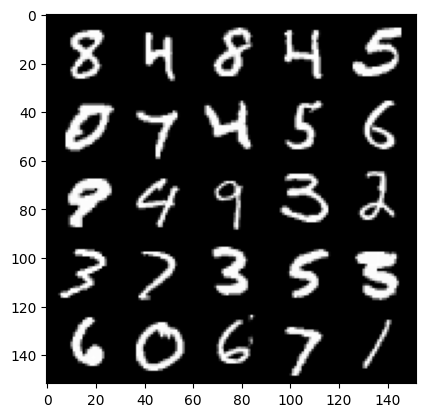

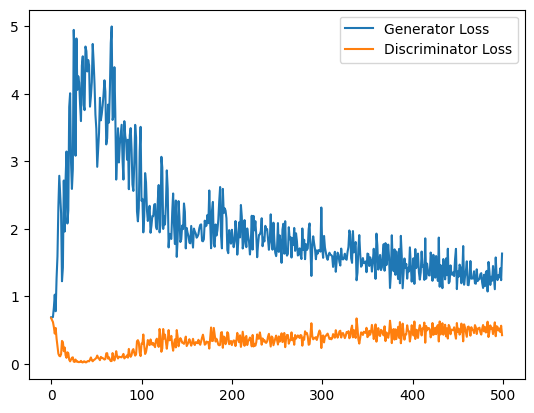

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 1.3111833336353302, discriminator loss: 0.5130071082115173


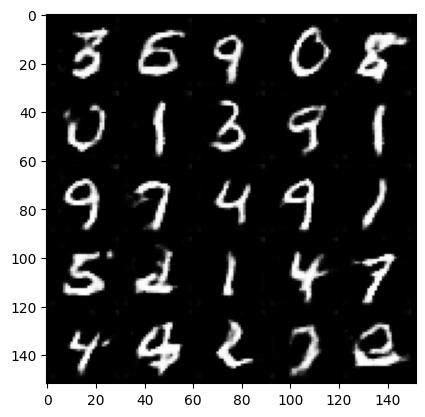

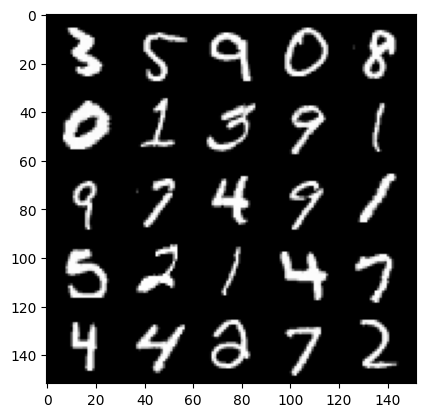

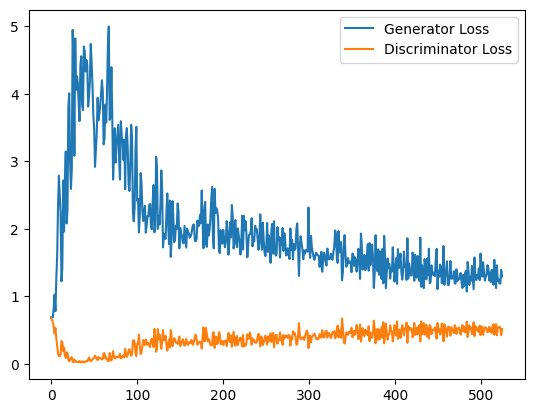

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 1.2185237635374069, discriminator loss: 0.5257927391529084


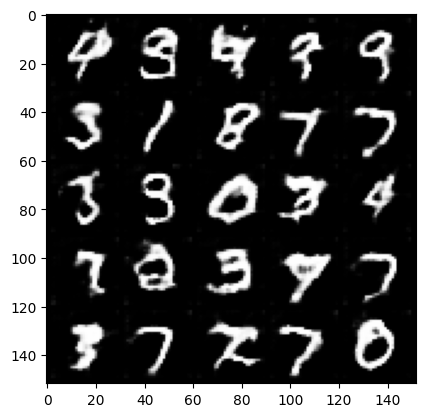

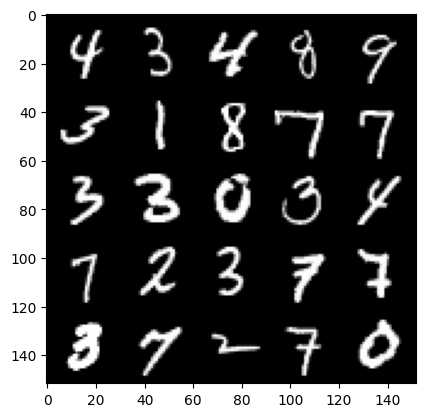

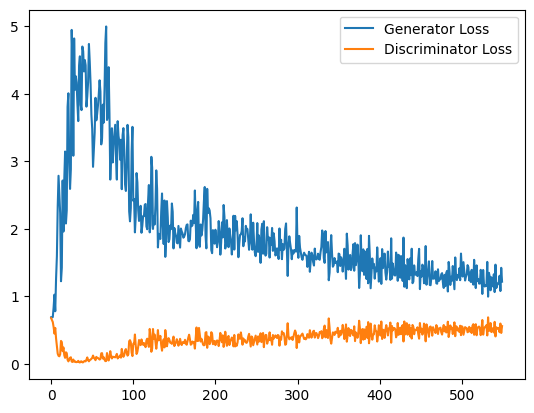

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 1.2317277898788452, discriminator loss: 0.5247208661437035


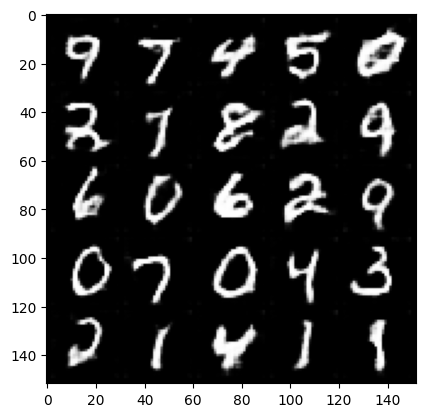

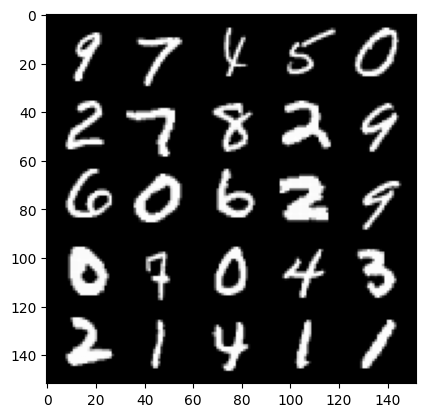

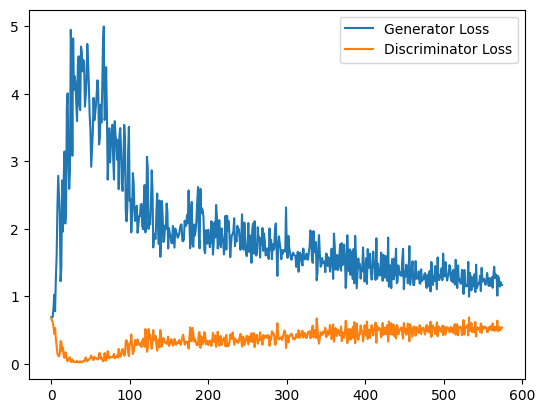

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 1.2190777082443238, discriminator loss: 0.5276761838197708


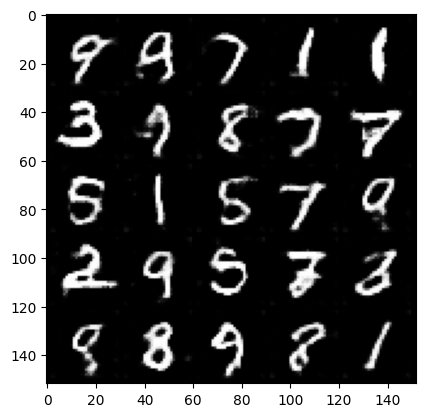

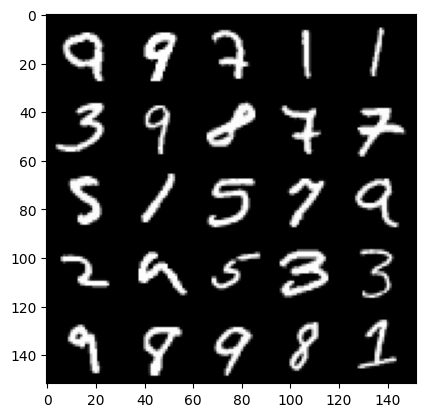

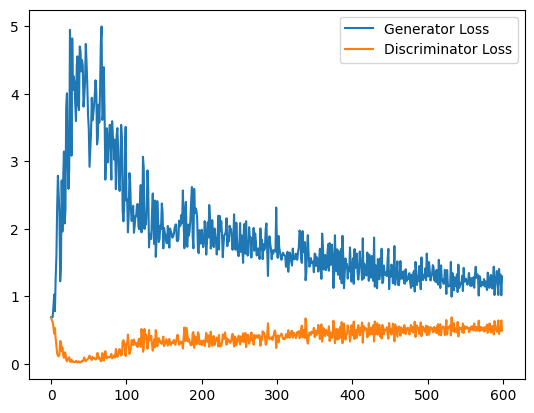

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 1.240357565522194, discriminator loss: 0.5405433464050293


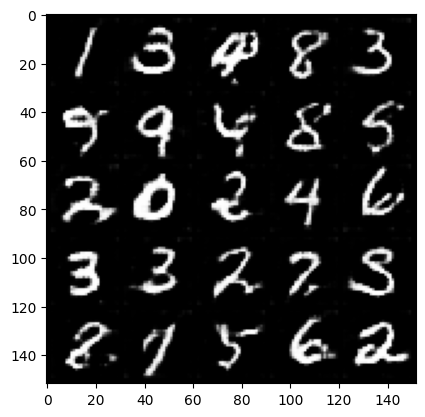

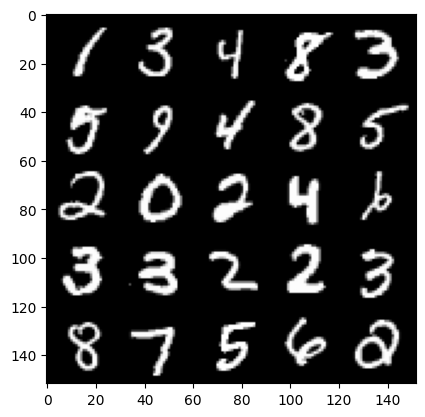

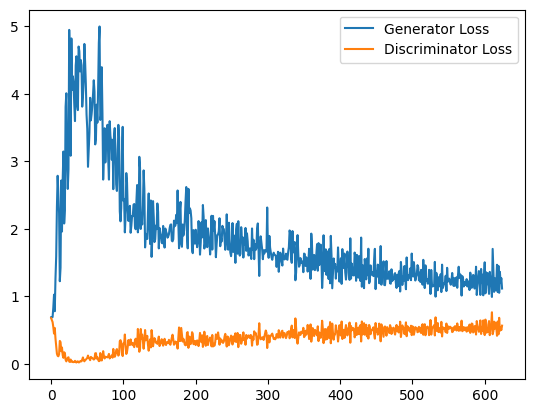

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 1.1798638967275619, discriminator loss: 0.5564953665137291


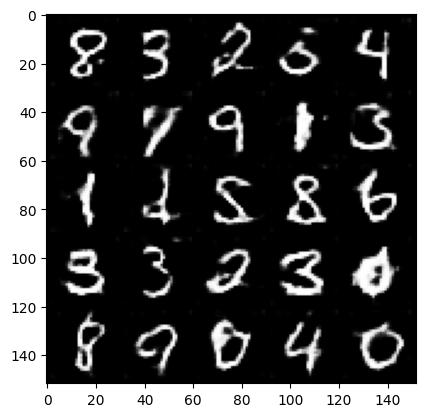

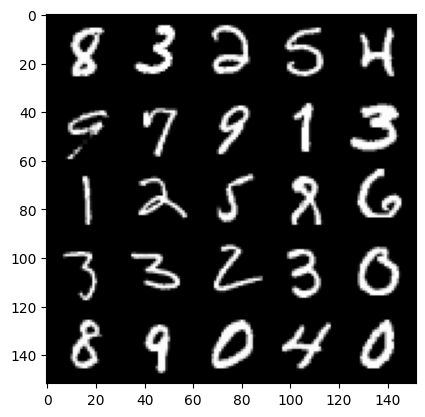

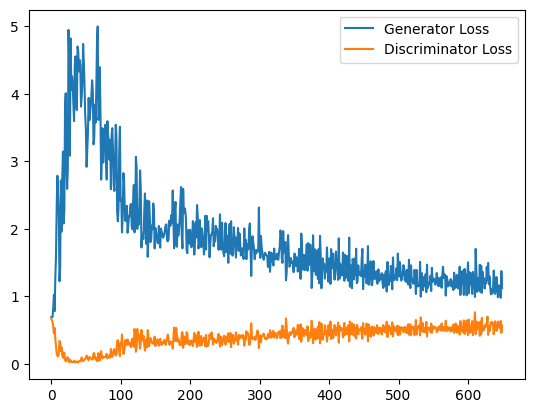

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 1.1444929909706116, discriminator loss: 0.5529398611187935


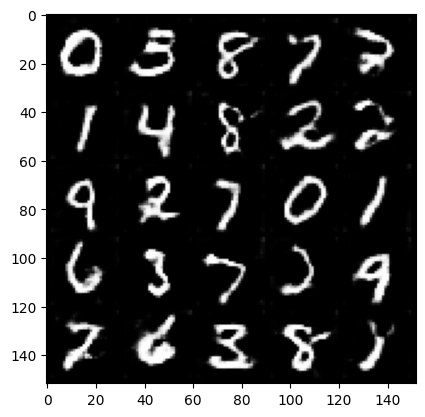

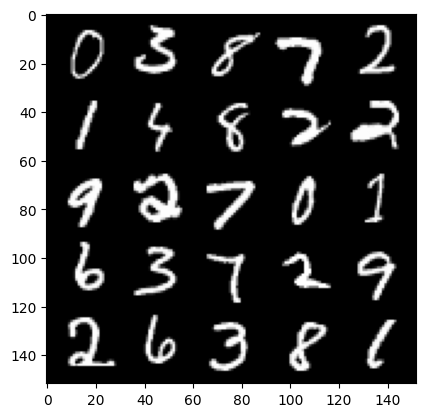

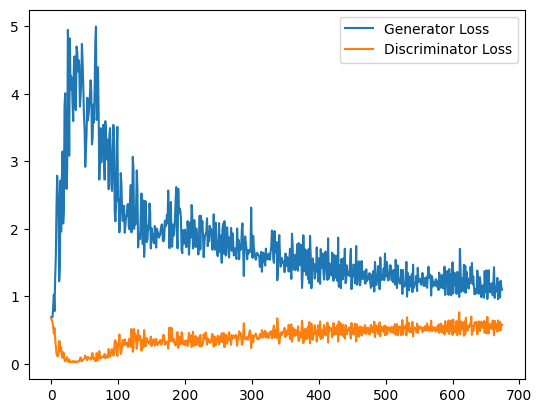

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 1.1763964185714721, discriminator loss: 0.5594061879515648


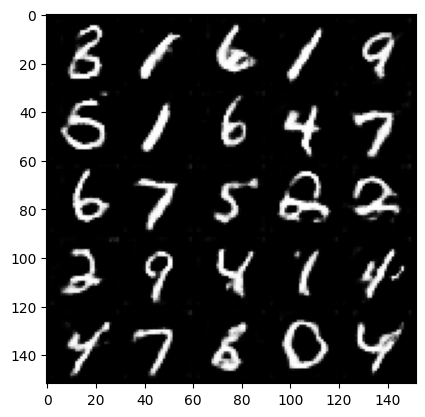

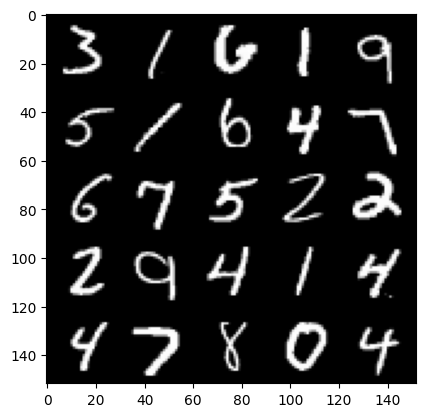

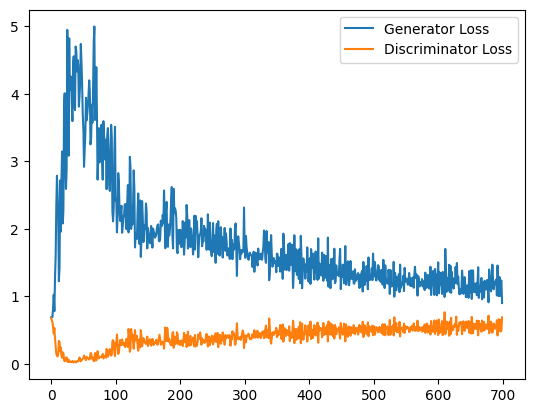

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 1.1573350014686585, discriminator loss: 0.5509124804735184


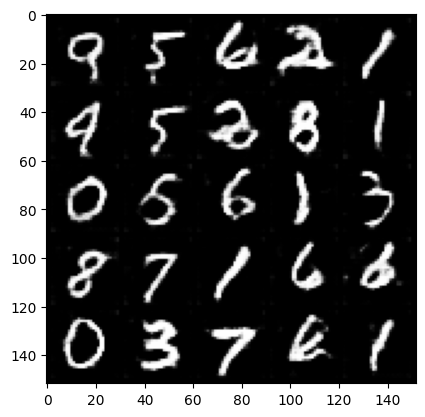

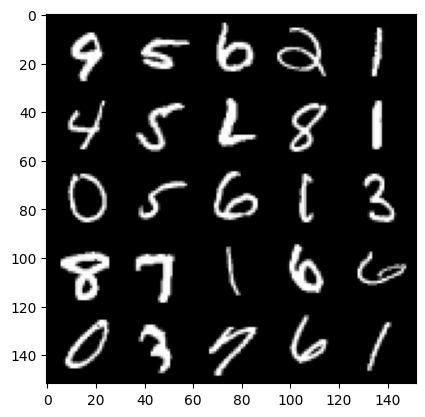

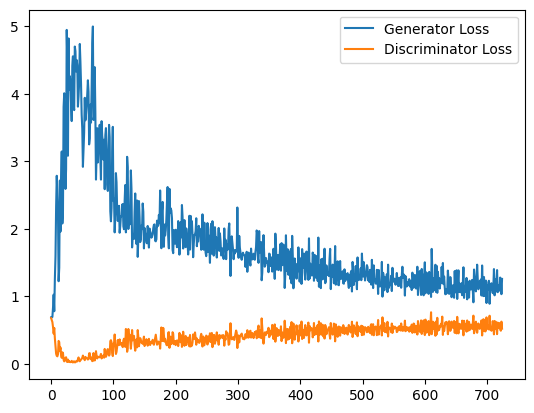

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 1.1493468829393387, discriminator loss: 0.5551796320676804


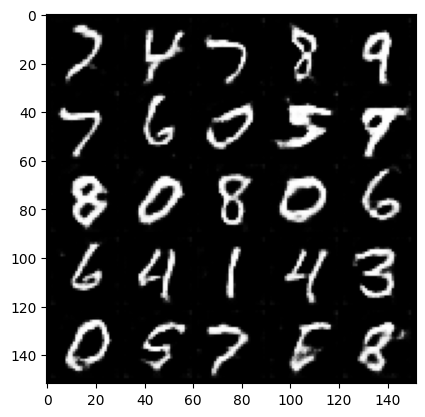

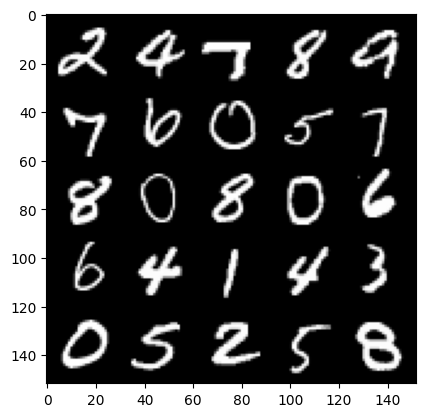

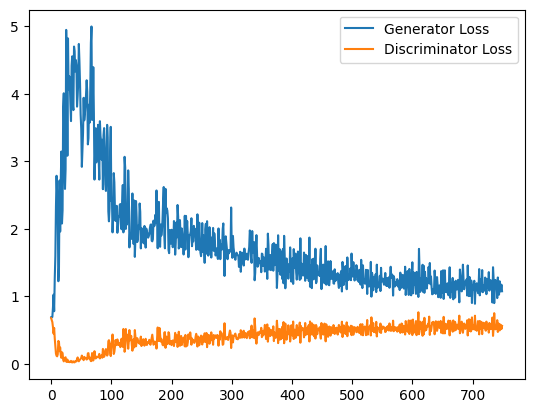

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 1.1180507431030273, discriminator loss: 0.556045274734497


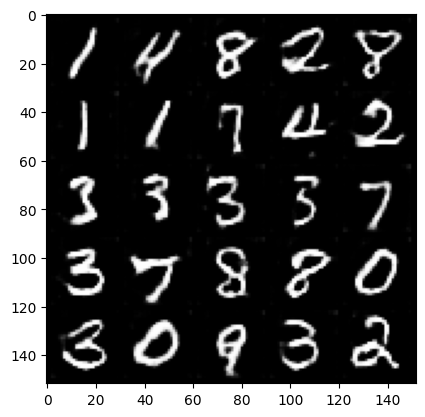

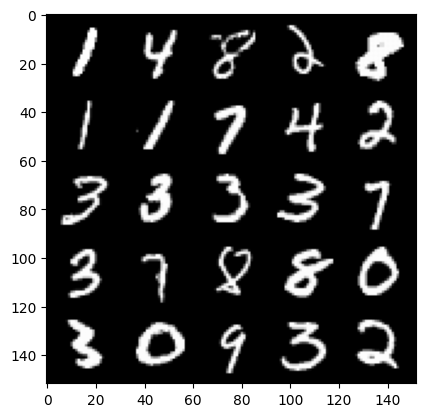

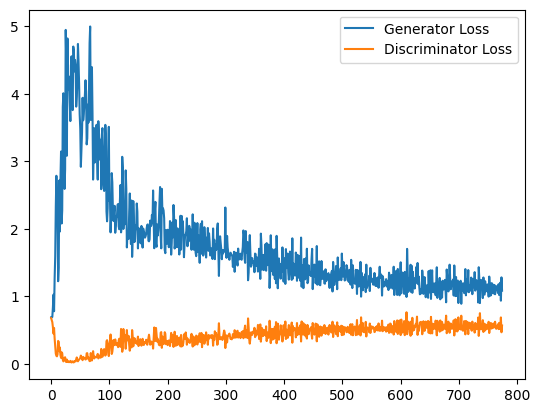

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 1.1148931564092637, discriminator loss: 0.5586891845464707


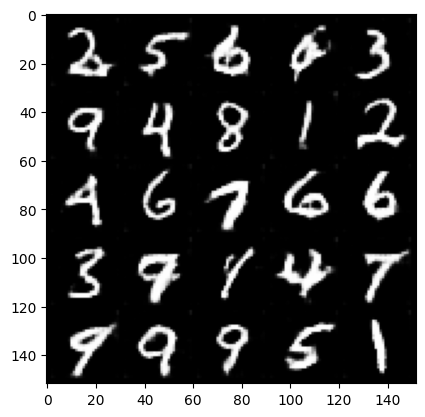

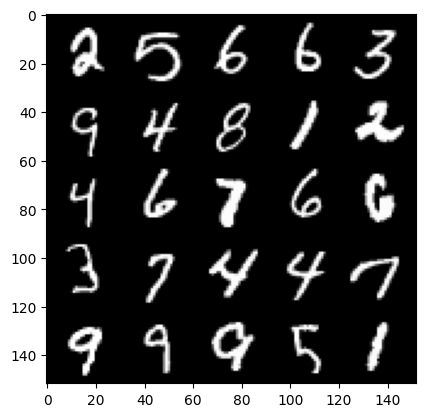

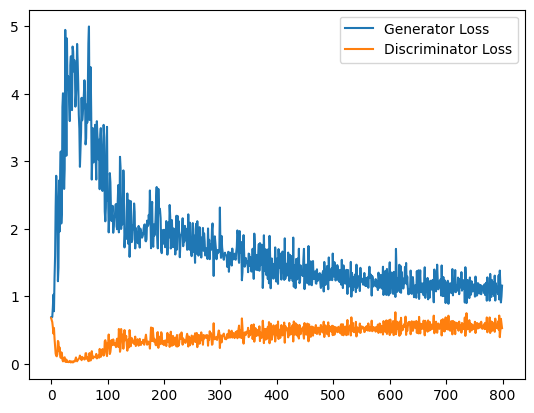

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 1.1144736337661743, discriminator loss: 0.5541294652223587


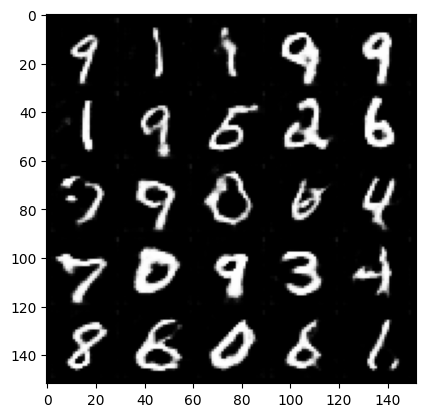

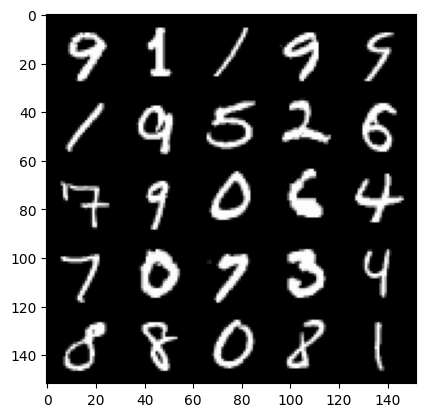

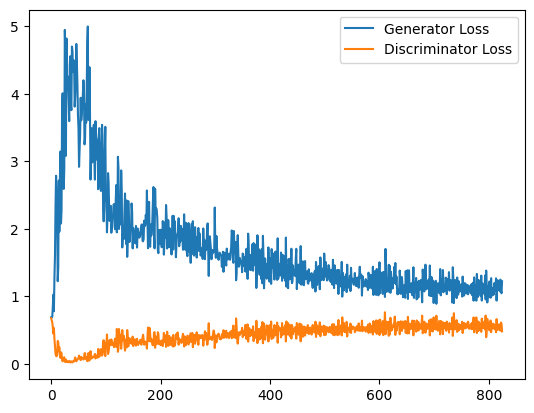

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 1.120972242474556, discriminator loss: 0.5632060085535049


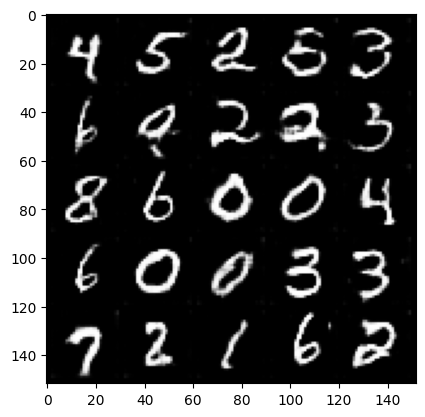

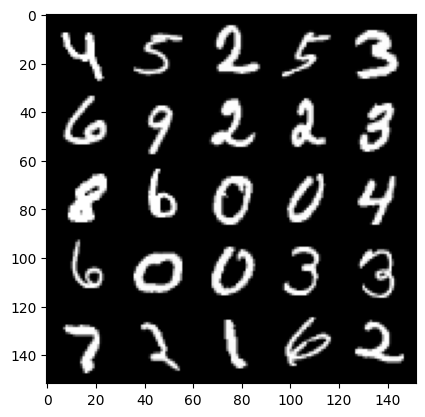

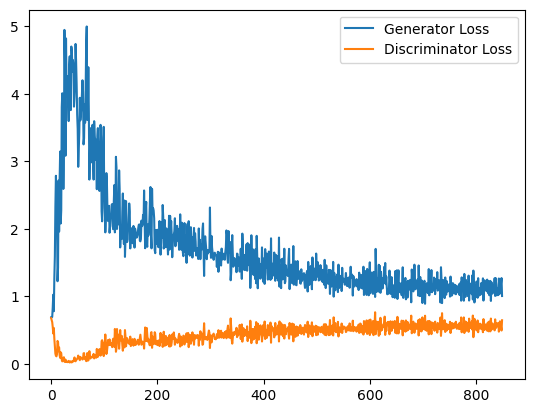

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 1.1458712115287781, discriminator loss: 0.5610957631468773


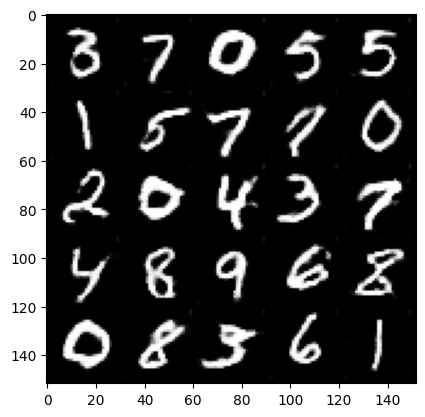

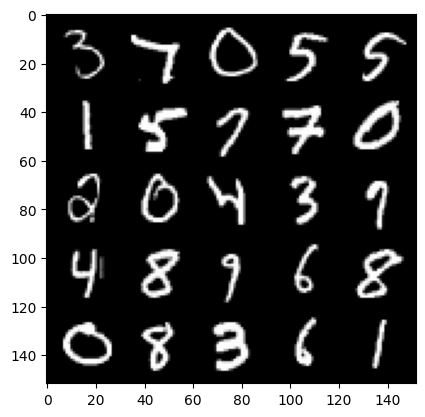

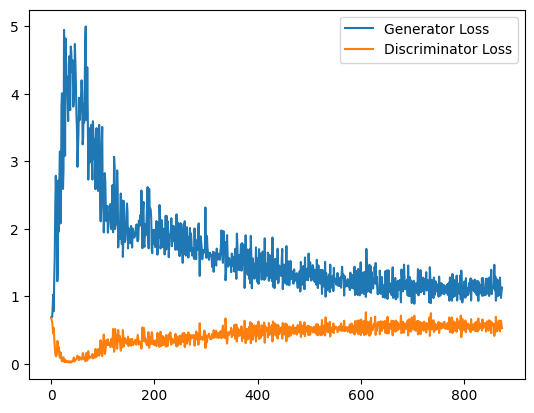

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 1.095772003173828, discriminator loss: 0.5707301670908927


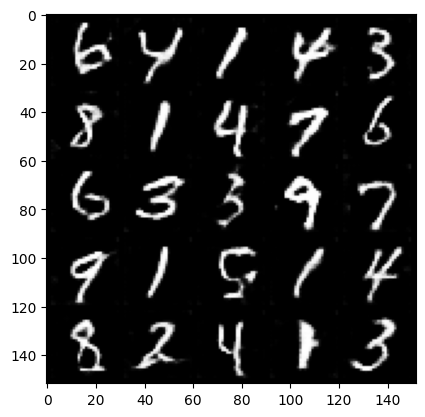

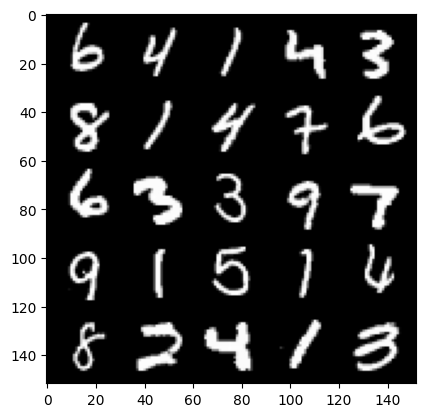

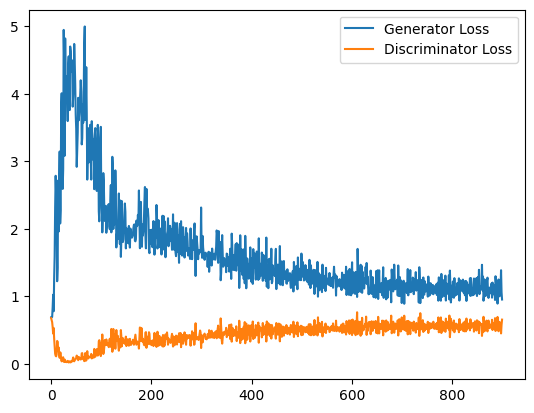

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 1.0761576433181763, discriminator loss: 0.5732240408062935


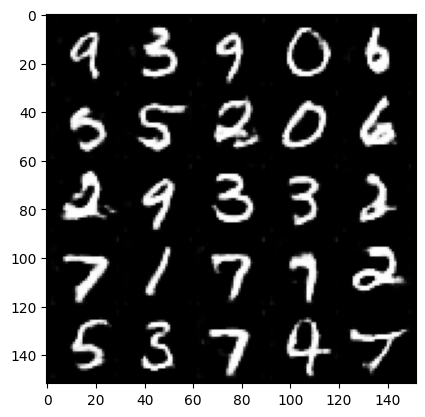

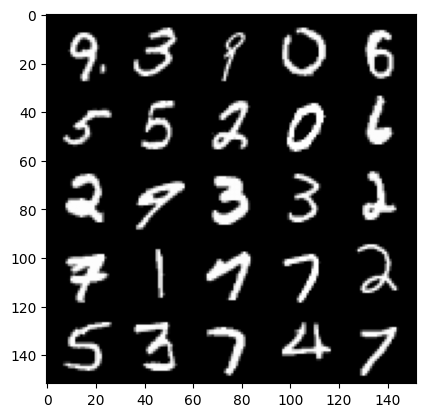

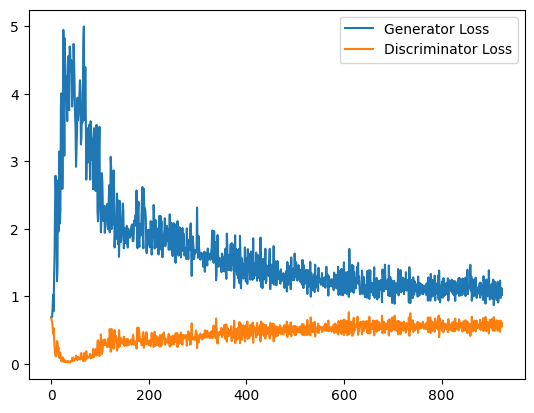

In [ ]:
cur_step = 0
generator_losses = []
discriminator_losses = []


noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)

        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)

        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images

        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        #### END CODE HERE ####

        # Make sure that enough images were generated
        assert len(fake) == len(real)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels,
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred

        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels)
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####

        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)

        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1

## Stable Diffusion

Stable Diffusion is a technique used for generating high-quality images from text descriptions. It works by gradually adding noise to an image and then reversing the process to refine the image, guided by the text prompt. The model starts with random noise and iteratively denoises it, aligning the output with the input text. This approach allows for creating detailed and coherent images, making it popular for various creative applications.

You can read more about diffusion models <a href="https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb">here</a>


### Setup & Imports

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Sep 14 11:41:32 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P0              27W /  70W |    347MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install --upgrade transformers==4.40.0 diffusers==0.27.2 ftfy==6.2.0 accelerate datasets bitsandbytes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.6/137.6 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 92.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 80.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.3/474.3 kB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.5/137.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.8 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
  Attempting uninstall: transformers
    Fou

In [ ]:
from argparse import Namespace
import math
from tqdm.auto import tqdm
from PIL import Image
import torch
from torch import autocast
from torchvision import transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler, LMSDiscreteScheduler, DDPMScheduler
from accelerate import Accelerator
from accelerate.utils import set_seed
import bitsandbytes as bnb

In [ ]:
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50           # Number of denoising steps
guidance_scale = 8                # Scale for classifier-free guidance
generator = torch.manual_seed(64)   # Seed generator to create the inital latent noise
batch_size = 1
torch_device = "cuda" if torch.cuda.is_available() else "cpu"
device = torch_device

### Importing Models

Stable Diffusion utilizes multiple models to operate. As it is demonstrated in the image below the process consists of multiple steps:
- The process starts with a tensor of random numbers, chosen as the initial embedding of the image.
- Simultaneously, a text prompt provided by the user is tokenized and converted into an embedding.
- Both embeddings are combined and fed into a U-Net model.
- The U-Net model goes through multiple iterations, gradually reducing the noise in the image.
- The scheduler defines the algorithm for noise reduction.
- Finally, the refined embedding is passed through the decoder of a VAE (Variational Autoencoder) to produce the output image.


<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>


To start, first we have to import all the required models.

In [ ]:
# Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")
# The UNet model for generating the latents
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")
scheduler = PNDMScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

We will define a function to convert the latent outputs to images.

In [ ]:
def latents_to_pil(latents):

    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

### Prompt to Embedding


To provide the U-net model with text guidance, we need to convert text inputs to embeddings.

It's important to note that the U-net model requires a positive embedding and also a negative embedding. The code for positive embedding is provided to you. As part of the homework try writing the code for getting the negative embedding. Since we are not going to provide any negative prompt, You can use empty strings.

In [ ]:
def prompt_to_emb(prompt):
    batch_size = len(prompt)
    text_inputs = tokenizer(
        prompt,
        padding="max_length",
        max_length=77,
        truncation=True,
        return_tensors="pt",
    )
    text_input_ids = text_inputs.input_ids
    prompt_embeds = text_encoder(text_input_ids.to(device))
    prompt_embeds = prompt_embeds[0]
    prompt_embeds_dtype = text_encoder.dtype
    prompt_embeds = prompt_embeds.to(dtype=prompt_embeds_dtype, device=device)
    _, seq_len, _ = prompt_embeds.shape
    prompt_embeds = prompt_embeds.repeat(1, 1, 1)
    prompt_embeds = prompt_embeds.view(batch_size * 1, seq_len, -1)
    max_length = prompt_embeds.shape[1]

    negative_text_inputs = tokenizer(
        [""] * batch_size,
        padding="max_length",
        max_length=77,
        truncation=True,
        return_tensors="pt",
    )
    negative_text_input_ids = negative_text_inputs.input_ids
    negative_prompt_embeds = text_encoder(negative_text_input_ids.to(device))
    negative_prompt_embeds = negative_prompt_embeds[0]
    negative_prompt_embeds = negative_prompt_embeds.to(dtype=prompt_embeds_dtype, device=device)
    negative_prompt_embeds = negative_prompt_embeds.repeat(1, 1, 1)
    negative_prompt_embeds = negative_prompt_embeds.view(batch_size * 1, seq_len, -1)
    concatenated_embeddings = torch.cat([negative_prompt_embeds, prompt_embeds])

    return concatenated_embeddings
prompt_embeddings = prompt_to_emb(["A photo of a cat"])
print(prompt_embeddings.shape)

torch.Size([2, 77, 768])


### Embeding to Latents

This is the part where the input Embeddings go through multiple iterations to produce the image embedding.

In [ ]:
def emb_to_latents(text_embeddings):

    scheduler.set_timesteps(num_inference_steps)

    # Generate random latent noise for the input to the model
    latents = torch.randn((1, 4, 64, 64),dtype=torch.float32).to(torch_device)

    for t in tqdm(scheduler.timesteps):
        # Duplicate the random latent noise
        latent_model_input = torch.cat([latents] * 2)

        # Scale the model input
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings,return_dict=False,added_cond_kwargs={'text_embeds':text_embeddings})[0]

        # Apply classifier-free guidance scale
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        latents = scheduler.step(noise_pred, t, latents,return_dict=False)[0]

    return latents

### Evaluate

Let's try the pipeline with a few examples.

  0%|          | 0/51 [00:00<?, ?it/s]

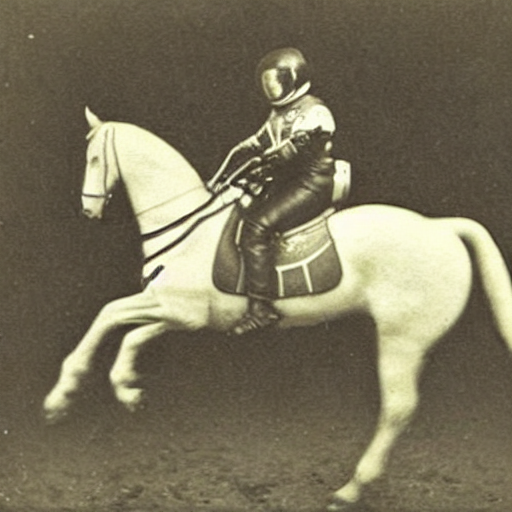

In [ ]:
prompt = ["a photograph of an astronaut riding a horse"]
text_embeddings = prompt_to_emb(prompt)
latents = emb_to_latents(text_embeddings)
image = latents_to_pil(latents)
image[0]

  0%|          | 0/51 [00:00<?, ?it/s]

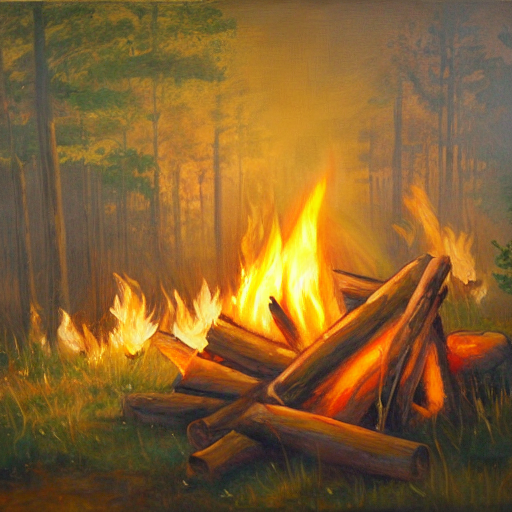

In [ ]:
prompt = ["a campfire (oil on canvas)"]
text_embeddings = prompt_to_emb(prompt)
latents = emb_to_latents(text_embeddings)
image = latents_to_pil(latents)
image[0]

# Task



In this task, we aim to fine-tune the Stable Diffusion model for generating medical images using input text. The model ID is provided in the code for your convenience. You need to download the medical images and texts from the link below and convert the texts inside the `.txt` files into the following format:

```
Age: age_number, Gender: gender_type, findings: findings#1. findings#2. ..
```

The `.txt` files contain information in the format:

```
gender_type age_numberyrs
findings#1
findings#2
...
```

Note that there may or may not be certain symbols between `gender_type` and `age_number`. You must handle all scenarios appropriately. Additionally, in the part referring to `age_number`, the three letters `yrs` are included but should not be incorporated into your prompt.

After constructing the prompts, create a CSV file with the following headers:

```
filename, findings
```

In the `filename` column, include the name of each image, and in the `findings` column, add the constructed prompt. For example:

```
filename, findings
example.png, "Age: 24, Gender: Male, findings: normal"
```

Now your dataset is ready.

You will train the model on this dataset. The training process will follow the standard approach for training diffusion models conditioned on input text. That is, an input image is fed into the model, noise is added, the input prompt is encoded and fused with the image encoding, and during the denoising process, the model attempts to learn the noise for the image.

This type of training is self-supervised, as there are no actual labels in this problem, and during training, we generate labels for the inputs.

For fine-tuning, we will use the **LoRA (Low-Rank Adaptation)** method.

In this method, only the `Linear` layers within the **UNet** and **text encoder** components will be called and replaced with LoRA-specific layers, while the rest of the model remains frozen. You must implement this method from scratch.

Here is the process:
1. Define your custom `LoRALinear` layer.
2. Replace the existing `Linear` layers in the **UNet** and **text encoder** components with your `LoRALinear` layer.
3. Freeze the rest of the model and train only these LoRA layers.


Download the dataset from the following link **CXR_png** and **ClinicalReadings** dir

[link](https://data.lhncbc.nlm.nih.gov/public/Tuberculosis-Chest-X-ray-Datasets/Shenzhen-Hospital-CXR-Set/index.html)

In [1]:
import os, gc, sys, time, random, math
import torch
import torch.nn as nn
import torch.nn.functional as F


from typing import Optional, List

torch.backends.cuda.enable_mem_efficient_sdp(False)
torch.backends.cuda.enable_flash_sdp(False)

from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

try:
    from diffusers import StableDiffusionPipeline
except:
    !pip install diffusers -q
    from diffusers import StableDiffusionPipeline

from tqdm import tqdm

from PIL import Image

import numpy as np
import pandas as pd

DEFAULT_RANDOM_SEED = 42

def seedBasic(seed=DEFAULT_RANDOM_SEED):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

def seedTorch(seed=DEFAULT_RANDOM_SEED):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seedBasic(); seedTorch();

def clear_cache():
    torch.cuda.empty_cache(); gc.collect(); time.sleep(1); torch.cuda.empty_cache(); gc.collect();


def check_and_make_folder(path):
    if not os.path.exists(path):
        os.system(f'mkdir -p {path}')


In [2]:
def print_trainable_parameters(model):
    total_parameter_count = sum([np.prod(p.size()) for p in model.parameters()])

    trainable_parameter = filter(lambda p: p.requires_grad, model.parameters())
    trainable_parameter_count = sum([np.prod(p.size()) for p in trainable_parameter])

    trainable_percentage = (trainable_parameter_count / total_parameter_count)  * 100

    formatted_output = (
        f"trainable params: {trainable_parameter_count:,} || "
        f"all params: {total_parameter_count:,} || "
        f"trainable%: {trainable_percentage:.16f}"
    )

    print(formatted_output)


def remove_param_from_optimizer(optim, param):
    for j in range(len(optim.param_groups)):
        optim_param_group_list = optim.param_groups[j]["params"]
        for i, optim_param in enumerate(optim_param_group_list):
            if param.shape == optim_param.shape and (param==optim_param).all():
                del optim.param_groups[j]["params"][i]

clear_cache()

In [3]:
WEIGHT_DTYPE = torch.float32
BATCH_SIZE = 1
LR = 1e-4
# The main path
Main_Path = '/content'
# The datasets path under the main path
Data_storage = Main_Path + '/dataset'
save_result_path = Main_Path + '/Result'

### folder to save the result.
folder_name = 'LoRA'

check_and_make_folder(f'{save_result_path}/{folder_name}')

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model_id = "runwayml/stable-diffusion-v1-5"

UNET_TARGET_MODULES = [
    "to_q", "to_k", "to_v",
    "proj", "proj_in", "proj_out",
    "conv", "conv1", "conv2",
    "conv_shortcut", "to_out.0", "time_emb_proj", "ff.net.2",
]


TEXT_ENCODER_TARGET_MODULES = ["fc1", "fc2", "q_proj", "k_proj", "v_proj", "out_proj"]

In [4]:
"""
Prepare a Stable Diffusion model for fine-tuning or targeted use by loading its components,
extracting key modules, and freezing certain parts to preserve their pretrained functionality.
"""

pipe = ...

tokenizer = ...
noise_scheduler = ...
text_encoder = ...
vae = ...
unet =...

# Freeze the Bulk part of the model
text_encoder...
vae...
unet...

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
def remove_param_from_optimizer(optim, param):
    for j in range(len(optim.param_groups)):
        optim_param_group_list = optim.param_groups[j]["params"]
        for i, optim_param in enumerate(optim_param_group_list):
            if param.shape == optim_param.shape and (param==optim_param).all():
                del optim.param_groups[j]["params"][i]

clear_cache()

In [6]:
class LoRALayer():
    def __init__(
        self,
        r: int,
        lora_alpha: int,
        lora_dropout: float,
        merge_weights: bool,
    ):
        self.r = r
        self.lora_alpha = lora_alpha
        # Optional dropout
        if lora_dropout > 0.:
            self.lora_dropout = nn.Dropout(p=lora_dropout)
        else:
            self.lora_dropout = lambda x: x
        # Mark the weight as unmerged
        self.merged = False
        self.merge_weights = merge_weights

### This is the LoRA replacement of nn.Linear layer
class Linear(nn.Linear, LoRALayer):
    # LoRA implemented in a dense layer
    def __init__(
        self,
        in_features: int,
        out_features: int,
        name = '',
        r: int = 0,
        lora_alpha: int = 8,
        lora_dropout: float = 0.,
        EMA_factor: float = 0.6,
        # warmup_step_per_expand:int = 10,
        fan_in_fan_out: bool = False, # Set this to True if the layer to replace stores weight like (fan_in, fan_out)
        merge_weights: bool = True,
        **kwargs
    ):
        nn.Linear.__init__(self, in_features, out_features, **kwargs)
        LoRALayer.__init__(self, r=r, lora_alpha=lora_alpha, lora_dropout=lora_dropout,
                           merge_weights=merge_weights)
        self.name = name
        self.in_features = in_features
        self.out_features = out_features
        self.r = r
        self.fan_in_fan_out = fan_in_fan_out
        # Actual trainable parameters
        if r > 0:
            # Define A and B matrices with proper shape
            self.lora_A ...
            self.lora_B ...
            # define scaling variable
            self.scaling ...
            # Freezing the pre-trained weight matrix
            self.weight....

            self.recorded_grad = 1

        self.reset_parameters()
        if fan_in_fan_out:
            self.weight.data = self.weight.data.T

    def get_active_rank(self):
        assert self.lora_A.shape[0] == self.lora_B.shape[1]
        return self.lora_A.shape[0]

    def reset_parameters(self):
        nn.Linear.reset_parameters(self)
        if hasattr(self, 'lora_A'):
            nn.init.kaiming_uniform_(self.lora_A)
            nn.init.kaiming_uniform_(self.lora_B)


    def train(self, mode: bool = True):
        def T(w):
            return w.T if self.fan_in_fan_out else w
        nn.Linear.train(self, mode)
        if self.merge_weights and self.merged:
            # Make sure that the weights are not merged
            if self.r > 0:
                # training of LoRA layer used in backward
                self.weight.data ...
            self.merged = False

    def eval(self):
        def T(w):
            return w.T if self.fan_in_fan_out else w
        nn.Linear.eval(self)
        if self.merge_weights and not self.merged:
            # Merge the weights and mark it
            if self.r > 0:
                # validating of LoRA layer (merging weights phase)
                self.weight.data ...

            self.merged = True

    def forward(self, x: torch.Tensor, *args, **kwargs):
        def T(w):
            return w.T if self.fan_in_fan_out else w

        if self.r > 0 and not self.merged:
            # LoRA forwarding: res = orig_w * x + alpha * delta_w * drop_out(x)
            result ...

            if self.r > 0:
                result += ...
            return result
        else:
            return F.linear(x, T(self.weight), bias=self.bias)

In [7]:
text_encoder = pipe.text_encoder
text_encoder = text_encoder.requires_grad_(False)
unet = pipe.unet
unet = unet.requires_grad_(False)

def set_Linear_SeLoRA(model):
    # Replace all linear layers with LoRA layers
    # Set LoRA weight and bias from original layer
    # freeze pretrained weights and bias
    # pay attention to the shapes transfer
    for name, layer in model.named_modules():
        if isinstance(layer, nn.Linear):
            LoRA_layer = ...

            # Navigate through the model hierarchy to replace the layer
            parent_module = model
            sub_layers = name.split('.')
            for layer_name in sub_layers[:-1]:
                parent_module = getattr(parent_module, layer_name)

            setattr(parent_module, sub_layers[-1], LoRA_layer)
    return model


# unet_lora = unet
unet_lora = set_Linear_SeLoRA(unet)
text_encoder_lora = set_Linear_SeLoRA(text_encoder)

print_trainable_parameters(text_encoder_lora)
print_trainable_parameters(unet_lora)

trainable params: 663,552 || all params: 123,724,032 || trainable%: 0.5363161782506409
trainable params: 1,705,984 || all params: 861,226,948 || trainable%: 0.1980876241694193


In [8]:
class ImageDataset(Dataset):
    def __init__(self, root_dir, df, tokenizer, size = 224, center_crop = True):
        self.root_dir = root_dir
        self.files = df['filename'].tolist()
        self.findings = df['findings'].tolist()
        self.tokenizer = tokenizer
        self.image_transforms = transforms.Compose(
            [
                ... # Do resize and use bilinear interpolation
                ... # Do centercrop or randomcrop as needed
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )


    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        example = {}
        instance_image = Image.open(
            os.path.join(self.root_dir, self.files[idx])
        ).convert("RGB")

        # apply image transformations on instance image
        example["instance_images"] = ...
        '''
        tokenize a specific text instance (self.findings[idx]) using a tokenizer and
        prepare it as a padded and truncated sequence of token IDs in PyTorch tensor format.
        '''
        example["instance_prompt_ids"] = ...

        return example


In [9]:
from sklearn.model_selection import train_test_split

reports = pd.read_csv('/content/image_findings.csv')
reports = reports[['filename', 'findings']]

# Split the data into train, validation, and test sets
train_df, temp_df = train_test_split(reports, test_size=0.2, random_state=42)
valid_df, test_df = train_test_split(temp_df, test_size=0.2, random_state=42)

# ImageDataset initialization
train_ds = ImageDataset(
    ...,
)

valid_ds = ImageDataset(
    ...,
)

test_ds = ImageDataset(
    ...,
)

num_workers = os.cpu_count()

# DataLoader initialization
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=..., num_workers = num_workers)
valid_loader = DataLoader(valid_ds, batch_size=BATCH_SIZE, shuffle=..., num_workers = num_workers)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=..., num_workers = num_workers)


In [10]:
# optimize proper parameters
optimizer = torch.optim.Adam(..., lr=LR)

In [11]:
import pandas as pd
from tqdm.notebook import tqdm
from IPython.display import display
import copy


class Trainer:
    def __init__(self, vae, unet, text_encoder, noise_scheduler, optimizer, train_dl, test_dl, total_epoch, WEIGHT_DTYPE, threshould = 2, per_iter_valid = 60, log_period = 20):
        self.vae = vae.to(device, dtype=WEIGHT_DTYPE)
        self.unet = unet.to(device, dtype=WEIGHT_DTYPE)
        self.text_encoder = text_encoder.to(device, dtype=WEIGHT_DTYPE)
        self.noise_scheduler = noise_scheduler
        self.optimizer = optimizer
        self.train_dl = train_dl
        self.test_dl = test_dl
        self.WEIGHT_DTYPE = WEIGHT_DTYPE
        self.total_epoch = total_epoch
        self.threshould = threshould
        self.per_iter_valid = per_iter_valid
        self.total_step = 0
        self.result_df = pd.DataFrame(columns=['epoch', 'steps', 'Train Loss', 'Valid Loss'])
        self._display_id = None
        self.log_period = log_period

        self.best_text_encoder = None
        self.best_unet = None

        self.display_line = ''

        print(f'total steps: {len(train_dl) * total_epoch}')

    def valid(self):
        self.unet.eval()
        self.text_encoder.eval()
        self.vae.eval()

        valid_pbar = tqdm(self.test_dl, desc = 'validating', leave = False)

        valid_loss, number_of_instance = [], 0

        for step, batch in enumerate(valid_pbar):
            # define batch, transfer to device, convert to weight's dtype, squeeze if needed.
            pixel_values = ...
            pormpt_idxs  = ...

            # Convert input images (pixel values) to latent representations in the latent space using the VAE encoder
            latents = ...
            # Scale the latent representations by the scaling factor from the VAE configuration
            latents = ...

            # Generate random noise of the same shape as the latents to simulate the diffusion process
            noise = ...
            bsz = latents.shape[0]
            # Sample random timesteps for each image, uniformly drawn from the range of timesteps in the noise scheduler
            timesteps = ...
            timesteps = ... #convert to long

            # Add noise to the latents at the selected timesteps according to the noise magnitude (forward diffusion process)
            noisy_latents = ...


            # Encode the text prompts into hidden states using the text encoder, which provides conditioning information
            encoder_hidden_states = ...
            # Predict the noise residual using the UNet model, conditioned on the noisy latents, timesteps, and text embeddings
            model_pred = ...
            # Define the target for the loss function
            target = ...
            # Calculate the loss between the predicted noise (model output) and the actual noise
            # This measures how well the model predicts the noise for the reverse diffusion process
            loss = ...

            valid_loss.append(loss.item() * len(batch))
            number_of_instance += len(batch)
            clear_cache()
            torch.cuda.empty_cache()


        ########################################################################
        ## add log and save model here TODO
        ########################################################################

        self.unet.train()
        self.vae.train()
        self.text_encoder.train()

        torch.cuda.empty_cache()

        return sum(valid_loss) / number_of_instance

    def train(self):

        self._display_id = display(self.result_df, display_id=True)
        self.rank_display_id = display('', display_id=True)

        self.vae.train()
        self.unet.train()
        self.text_encoder.train()


        recorded_loss = []

        for epoch in range(self.total_epoch):

            pbar = tqdm(self.train_dl)
            for step, batch in enumerate(pbar):

                pixel_values = batch["instance_images"].to(device, dtype=self.WEIGHT_DTYPE)
                pormpt_idxs  = batch["instance_prompt_ids"].to(device).squeeze(1)

                # Convert input images (pixel values) to latent representations in the latent space using the VAE encoder
                latents = ...
                # Scale the latent representations by the scaling factor from the VAE configuration
                latents = ...

                # Generate random noise of the same shape as the latents to simulate the diffusion process
                noise = ...
                bsz = latents.shape[0]
                # Sample random timesteps for each image, uniformly drawn from the range of timesteps in the noise scheduler
                timesteps = ...
                timesteps = ... #convert to long

                # Add noise to the latents at the selected timesteps according to the noise magnitude (forward diffusion process)
                noisy_latents = ...


                # Encode the text prompts into hidden states using the text encoder, which provides conditioning information
                encoder_hidden_states = ...
                # Predict the noise residual using the UNet model, conditioned on the noisy latents, timesteps, and text embeddings
                model_pred = ...
                # Define the target for the loss function
                target = ...
                # Calculate the loss between the predicted noise (model output) and the actual noise
                # This measures how well the model predicts the noise for the reverse diffusion process
                loss = ...

                self.optimizer.zero_grad()

                loss.backward()

                recorded_loss.append(loss.item())

                pbar.set_description(f"[Loss: {recorded_loss[-1]:.3f}/{np.mean(recorded_loss):.3f}]")

                self.optimizer.step()

                self.total_step += 1

                clear_cache()


                if self.total_step % self.per_iter_valid == 0:

                    valid_rmse = self.valid()

                    if valid_rmse <= min([x for x in trainer.result_df['Valid Loss'] if x != ' --- '] + [1.0]):

                        self.best_text_encoder = copy.deepcopy(self.text_encoder).cpu()
                        self.best_unet = copy.deepcopy(self.unet).cpu()

                        check_and_make_folder(f'{save_result_path}/{folder_name}/trained_model')
                        check_and_make_folder(f'{save_result_path}/{folder_name}/trained_model/final_Unet')
                        check_and_make_folder(f'{save_result_path}/{folder_name}/trained_model/final_Text')

                        self.unet.save_pretrained(f'{save_result_path}/{folder_name}/trained_model/final_Unet')
                        self.text_encoder.save_pretrained(f'{save_result_path}/{folder_name}/trained_model/final_Text')


                    self.result_df.loc[len(self.result_df)] = [epoch, self.total_step, np.round(np.mean(recorded_loss), 4), np.round(valid_rmse, 4)]


                    self._display_id.update(self.result_df)

                    recorded_loss = []

                if self.total_step % self.log_period == 0:

                    self.result_df.loc[len(self.result_df)] = [epoch, self.total_step, np.round(np.mean(recorded_loss), 4), ' --- ']

                    self._display_id.update(self.result_df)

                    self.result_df.to_csv(f'{save_result_path}/{folder_name}/results.csv')


trainer = Trainer(
    vae = vae,
    unet = unet_lora,
    text_encoder = text_encoder_lora,
    noise_scheduler = noise_scheduler,
    optimizer = optimizer,
    train_dl = train_loader,
    test_dl = valid_loader,
    total_epoch = 10,
    WEIGHT_DTYPE = WEIGHT_DTYPE,
    threshould = 1.3,
    per_iter_valid = len(train_loader),
    log_period = 40,
)


trainer.train()


total steps: 5290


,epoch,steps,Train Loss,Valid Loss
0,0.0,40.0,0.8671,---
1,0.0,80.0,0.8361,---
2,0.0,120.0,0.8195,---
3,0.0,160.0,0.7954,---
4,0.0,200.0,0.7699,---
5,0.0,240.0,0.7369,---
6,0.0,280.0,0.7098,---
7,0.0,320.0,0.6719,---
8,0.0,360.0,0.6436,---
9,0.0,400.0,0.6167,---


''

  0%|          | 0/529 [00:00<?, ?it/s]

validating:   0%|          | 0/106 [00:00<?, ?it/s]

  0%|          | 0/529 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [12]:
trainer.result_df.to_csv(f'{save_result_path}/{folder_name}/results.csv')

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

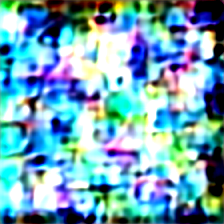

  0%|          | 0/50 [00:00<?, ?it/s]

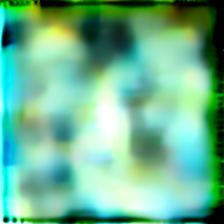

  0%|          | 0/50 [00:00<?, ?it/s]

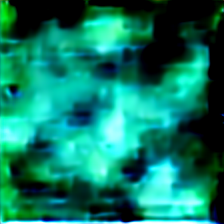

  0%|          | 0/50 [00:00<?, ?it/s]

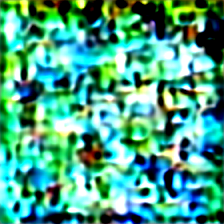

  0%|          | 0/50 [00:00<?, ?it/s]

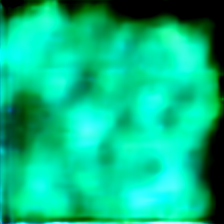

  0%|          | 0/50 [00:00<?, ?it/s]

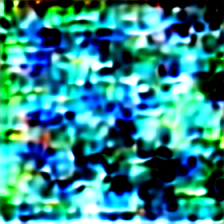

  0%|          | 0/50 [00:00<?, ?it/s]

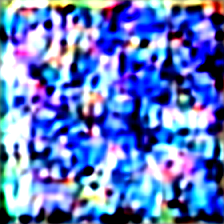

  0%|          | 0/50 [00:00<?, ?it/s]

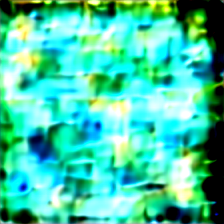

  0%|          | 0/50 [00:00<?, ?it/s]

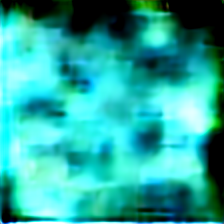

  0%|          | 0/50 [00:00<?, ?it/s]

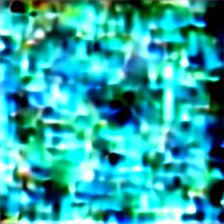

  0%|          | 0/50 [00:00<?, ?it/s]

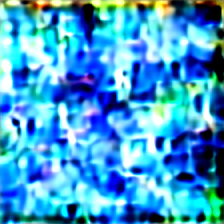

  0%|          | 0/50 [00:00<?, ?it/s]

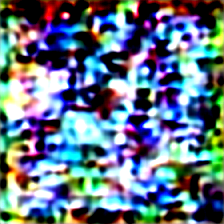

  0%|          | 0/50 [00:00<?, ?it/s]

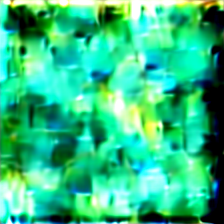

  0%|          | 0/50 [00:00<?, ?it/s]

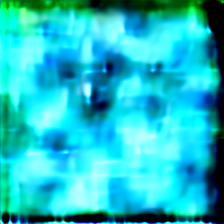

  0%|          | 0/50 [00:00<?, ?it/s]

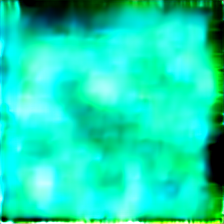

  0%|          | 0/50 [00:00<?, ?it/s]

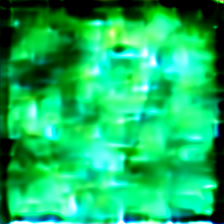

  0%|          | 0/50 [00:00<?, ?it/s]

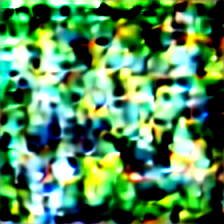

  0%|          | 0/50 [00:00<?, ?it/s]

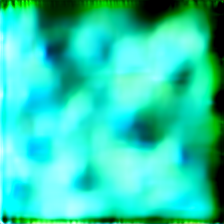

  0%|          | 0/50 [00:00<?, ?it/s]

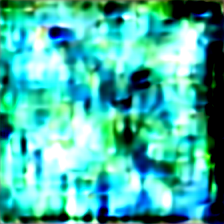

  0%|          | 0/50 [00:00<?, ?it/s]

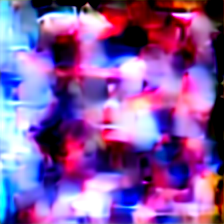

  0%|          | 0/50 [00:00<?, ?it/s]

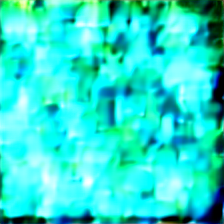

  0%|          | 0/50 [00:00<?, ?it/s]

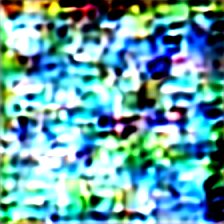

  0%|          | 0/50 [00:00<?, ?it/s]

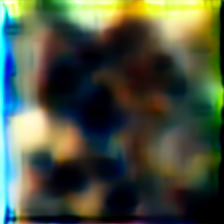

  0%|          | 0/50 [00:00<?, ?it/s]

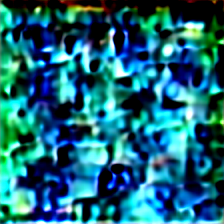

  0%|          | 0/50 [00:00<?, ?it/s]

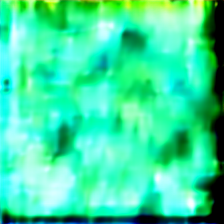

  0%|          | 0/50 [00:00<?, ?it/s]

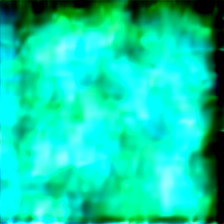

  0%|          | 0/50 [00:00<?, ?it/s]

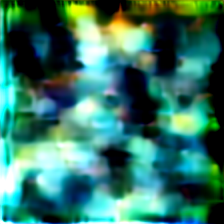

In [13]:
unet_lora.eval()
text_encoder_lora.eval()
clear_cache()

"""
assembles a customized Stable Diffusion pipeline for image generation
using the fine-tuned components (best_text_encoder, best_unet, etc.)
beside old components (vae, noise scheduler, tokenizer, etc.)
"""
new_pipe = ...

new_pipe.to(device)

check_and_make_folder(f'{save_result_path}/{folder_name}')
check_and_make_folder(f'{save_result_path}/{folder_name}/test_images')

for place in range(len(test_df)):
    temp_prompts = test_df.findings.iloc[place]

    # generate new 224*224 image from input prompt
    temp = ...

    temp.save(f'{save_result_path}/{folder_name}/test_images/{place}.png')

    display(temp)